In [1]:
import os
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path

import datetime

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
import math

import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from pandas.api.types import CategoricalDtype

pd.options.display.max_rows = 100
pd.options.display.max_colwidth = 100
pd.options.display.max_columns = 600

from scipy.signal.windows import blackman, hann, hamming
from scipy.signal import periodogram, welch, correlate
from scipy import fft
from scipy import stats

from tqdm import tqdm

#import multiprocessing
#import asyncio

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import acf, pacf, plot_pacf, plot_acf
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier, Fourier
from statsmodels.tsa.tsatools import lagmat
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.iolib.table import SimpleTable

import pmdarima as pm

from sklearn.linear_model import LinearRegression, HuberRegressor, RANSACRegressor
#from category_encoders import MEstimateEncoder
#from sklearn.cluster import KMeans
#from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
#from sklearn.preprocessing import StandardScaler

#from sklearn.ensemble import GradientBoostingRegressor as skGBR, RandomForestRegressor as skRFR
from xgboost import XGBRegressor
#import lightgbm as lgb



#from sklearn.cluster import DBSCAN
#from sklearn.neighbors import NearestNeighbors

#import altair as alt
#from altair.expr import datum
#alt.renderers.enable('default')
#from altair_widgets import interact_with
#from altair_saver import save

In [2]:
''' Plot settings'''

plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

In [3]:
def func_smape(Ft, At):    
    denom = (np.abs(At) + np.abs(Ft))/2
    diff = np.abs(Ft - At)/denom
    diff[denom == 0] = 0
    
    return np.nanmean(diff)*100

# Loading data

In [4]:
#df_train_1 = pd.read_csv('../train_1.csv')
df_train = pd.read_csv('data/train_2.csv')
df_train.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,...,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,2016-11-21,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,2017-01-01,2017-01-02,2017-01-03,2017-01-04,2017-01-05,2017-01-06,2017-01-07,2017-01-08,2017-01-09,2017-01-10,2017-01-11,2017-01-12,2017-01-13,2017-01-14,2017-01-15,2017-01-16,2017-01-

In [5]:
df_train.columns = ['Page'] + [x.date() for x in pd.to_datetime(df_train.columns[1:])]
df_train.set_index('Page', inplace=True)
df_train.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,2015-08-19,2015-08-20,2015-08-21,2015-08-22,2015-08-23,2015-08-24,2015-08-25,2015-08-26,2015-08-27,2015-08-28,2015-08-29,2015-08-30,2015-08-31,2015-09-01,2015-09-02,2015-09-03,2015-09-04,2015-09-05,2015-09-06,2015-09-07,2015-09-08,2015-09-09,2015-09-10,2015-09-11,2015-09-12,2015-09-13,2015-09-14,2015-09-15,2015-09-16,2015-09-17,2015-09-18,2015-09-19,2015-09-20,2015-09-21,2015-09-22,2015-09-23,2015-09-24,2015-09-25,2015-09-26,2015-09-27,2015-09-28,2015-09-29,2015-09-30,2015-10-01,2015-10-02,2015-10-03,2015-10-04,2015-10-05,2015-10-06,2015-10-07,2015-10-08,2015-10-09,2015-10-10,2015-10-11,2015-10-12,2015-10-13,2015-10-14,2015-10-15,2015-10-16,2015-10-17,2015-10-18,2015-10-19,2015-10-20,2015-10-21,2015-10-22,2015-10-23,2015-10-24,2015-10-25,2015-10-26,2015-10-27,2015-10-28,2015-10-29,2015-10-30,2015-10-31,2015-11-01,2015-11-02,2015-11-03,2015-11-04,2015-11-05,2015-11-06,2015-11-07,2015-11-08,2015-11-09,2015-11-10,2015-11-11,2015-11-12,2015-11-13,2015-11-14,2015-11-15,2015-11-16,2015-11-17,2015-11-18,2015-11-19,2015-11-20,2015-11-21,2015-11-22,2015-11-23,2015-11-24,2015-11-25,2015-11-26,2015-11-27,2015-11-28,2015-11-29,2015-11-30,2015-12-01,2015-12-02,2015-12-03,2015-12-04,2015-12-05,2015-12-06,2015-12-07,2015-12-08,2015-12-09,2015-12-10,2015-12-11,2015-12-12,2015-12-13,2015-12-14,2015-12-15,2015-12-16,2015-12-17,2015-12-18,2015-12-19,2015-12-20,2015-12-21,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,2016-01-11,2016-01-12,2016-01-13,2016-01-14,2016-01-15,2016-01-16,2016-01-17,2016-01-18,2016-01-19,2016-01-20,2016-01-21,2016-01-22,2016-01-23,2016-01-24,2016-01-25,2016-01-26,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,2016-02-07,2016-02-08,2016-02-09,2016-02-10,2016-02-11,2016-02-12,2016-02-13,2016-02-14,2016-02-15,2016-02-16,2016-02-17,2016-02-18,2016-02-19,2016-02-20,2016-02-21,2016-02-22,2016-02-23,2016-02-24,2016-02-25,2016-02-26,2016-02-27,2016-02-28,2016-02-29,2016-03-01,2016-03-02,2016-03-03,2016-03-04,2016-03-05,2016-03-06,2016-03-07,2016-03-08,2016-03-09,2016-03-10,2016-03-11,2016-03-12,2016-03-13,2016-03-14,2016-03-15,2016-03-16,2016-03-17,2016-03-18,2016-03-19,2016-03-20,2016-03-21,2016-03-22,2016-03-23,2016-03-24,2016-03-25,2016-03-26,2016-03-27,2016-03-28,2016-03-29,2016-03-30,2016-03-31,2016-04-01,2016-04-02,2016-04-03,2016-04-04,2016-04-05,2016-04-06,2016-04-07,2016-04-08,2016-04-09,2016-04-10,2016-04-11,2016-04-12,2016-04-13,2016-04-14,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24,2016-04-25,...,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,2016-11-21,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,2017-01-01,2017-01-02,2017-01-03,2017-01-04,2017-01-05,2017-01-06,2017-01-07,2017-01-08,2017-01-09,2017-01-10,2017-01-11,2017-01-12,2017-01-13,2017-01-14,2017-01-15,2017-01-16,20

## Multiindex and multicolumns 

In [6]:
df_train.columns = pd.MultiIndex.from_tuples([(x.year, x.month, x.day, x.weekday()) for x in df_train.columns],names=['year','month','day','weekday'])
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145063 entries, 2NE1_zh.wikipedia.org_all-access_spider to Francisco_el_matemático_(serie_de_televisión_de_2017)_es.wikipedia.org_all-access_spider
Columns: 803 entries, (2015, 7, 1, 2) to (2017, 9, 10, 6)
dtypes: float64(803)
memory usage: 889.8+ MB


In [7]:
#df_train.reset_index(inplace=True)
df_train.head()

year                                                 2015                    \
month                                                  7                      
day                                                    1     2     3     4    
weekday                                                 2     3     4     5   
Page                                                                          
2NE1_zh.wikipedia.org_all-access_spider              18.0  11.0   5.0  13.0   
2PM_zh.wikipedia.org_all-access_spider               11.0  14.0  15.0  18.0   
3C_zh.wikipedia.org_all-access_spider                 1.0   0.0   1.0   1.0   
4minute_zh.wikipedia.org_all-access_spider           35.0  13.0  10.0  94.0   
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider   NaN   NaN   NaN   NaN   

year                                                                         \
month                                                                         
day                                                    5     6     7     8    
weekday                                                 6     0     1     2   
Page                                                                          
2NE1_zh.wikipedia.org_all-access_spider              14.0   9.0   9.0  22.0   
2PM_zh.wikipedia.org_all-access_spider               11.0  13.0  22.0  11.0   
3C_zh.wikipedia.org_all-access_spider                 0.0   4.0   0.0   3.0   
4minute_zh.wikipedia.org_all-access_spider            4.0  26.0  14.0   9.0   
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider   NaN   NaN   NaN   NaN   

year                                                                         \
month                                                                         
day                                                    9     10    11    12   
weekday                                                 3     4     5     6   
Page                                                                          
2NE1_zh.wikipedia.org_all-access_spider              26.0  24.0  19.0  10.0   
2PM_zh.wikipedia.org_all-access_spider               10.0   4.0  41.0  65.0   
3C_zh.wikipedia.org_all-access_spider                 4.0   4.0   1.0   1.0   
4minute_zh.wikipedia.org_all-access_spider           11.0  16.0  16.0  11.0   
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider   NaN   NaN   NaN   NaN   

year                                                                          \
month                                                                          
day                                                    13     14    15    16   
weekday                                                 0      1     2     3   
Page                                                                           
2NE1_zh.wikipedia.org_all-access_spider              14.0   15.0   8.0  16.0   
2PM_zh.wikipedia.org_all-access_spider               57.0   38.0  20.0  62.0   
3C_zh.wikipedia.org_all-access_spider                 1.0    6.0   8.0   6.0   
4minute_zh.wikipedia.org_all-access_spider           23.0  145.0  14.0  17.0   
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider   NaN    NaN   NaN   NaN   

year                                                                         \
month                                                                         
day                                                    17    18    19    20   
weekday                                                 4     5     6     0   
Page                                                                          
2NE1_zh.wikipedia.org_all-access_spider               8.0   8.0  16.0   7.0   
2PM_zh.wikipedia.org_all-access_spider               44.0  15.0  10.0  47.0   
3C_zh.wikipedia.org_all-access_spider                 4.0   5.0   1.0   2.0   
4minute_zh.wikipedia.org_all-access_spider           85.0   4.0  30.0  22.0   
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider   NaN   NaN   NaN   NaN   

year                               

In [8]:
# Split address on page, site, access, agent
page_data = [page.split('_') for page in df_train.index]

df_train.index = pd.MultiIndex.from_tuples([('_'.join(page[:-3]), page[-3], page[-2], page[-1]) for page in page_data],names=['page','site','access','agent'])

In [9]:
df_train['first_day'] = df_train.droplevel(level='weekday',axis=1).notna().idxmax(axis=1) 
df_train['first_day'] = df_train['first_day'].apply(lambda x: datetime.date(*x))


In [10]:
# The following procedure is necessary to assign 0 to all NaNs, but not to those before the article appeared.

df_train.fillna(0, inplace=True)
a = df_train.droplevel(level='weekday',axis=1).iloc[:,:-1]    

df_train.iloc[:,:-1] = a.where(a.apply(lambda x: ~(datetime.date(*x.name) < df_train.first_day)))

In [11]:
df_sorted = df_train.drop(columns='first_day').sum(axis=1).sort_values(ascending=False)
indx_10_pages = ['_'.join(df_sorted.index[0])] + ['_'.join(df_sorted.index[df_sorted.size//(i*10)]) for i in range(1,10)]

In [12]:
indx_10_pages

['Main_Page_en.wikipedia.org_all-access_all-agents',
 '大塚芳忠_ja.wikipedia.org_all-access_all-agents',
 "The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents",
 'Temperatura_es.wikipedia.org_all-access_all-agents',
 'Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents',
 'Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents',
 'Coca-Cola_en.wikipedia.org_all-access_all-agents',
 'Josh_Brolin_en.wikipedia.org_all-access_all-agents',
 'Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents',
 'Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents']

In [13]:
# Preparing the format suitable for modeling

df_train['full_page'] = ['_'.join(page) for page in df_train.index]
df_train = df_train.reset_index().drop(columns=['page','site','access','agent'],level=0).set_index('full_page')
df_firstDay = df_train.pop('first_day')
df_train = df_train.T
df_train.reset_index('weekday',inplace=True)
df_train.index = [pd.to_datetime(datetime.date(*s)) for s in df_train.index]
df_train.index.freq = 'D'
df_train

full_page,weekday,2NE1_zh.wikipedia.org_all-access_spider,2PM_zh.wikipedia.org_all-access_spider,3C_zh.wikipedia.org_all-access_spider,4minute_zh.wikipedia.org_all-access_spider,52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,5566_zh.wikipedia.org_all-access_spider,91Days_zh.wikipedia.org_all-access_spider,A'N'D_zh.wikipedia.org_all-access_spider,AKB48_zh.wikipedia.org_all-access_spider,ASCII_zh.wikipedia.org_all-access_spider,ASTRO_zh.wikipedia.org_all-access_spider,Ahq_e-Sports_Club_zh.wikipedia.org_all-access_spider,All_your_base_are_belong_to_us_zh.wikipedia.org_all-access_spider,AlphaGo_zh.wikipedia.org_all-access_spider,Android_zh.wikipedia.org_all-access_spider,Angelababy_zh.wikipedia.org_all-access_spider,Apink_zh.wikipedia.org_all-access_spider,Apple_II_zh.wikipedia.org_all-access_spider,As_One_zh.wikipedia.org_all-access_spider,B-PROJECT_zh.wikipedia.org_all-access_spider,B1A4_zh.wikipedia.org_all-access_spider,BDSM_zh.wikipedia.org_all-access_spider,BEAST_zh.wikipedia.org_all-access_spider,BIGBANG_zh.wikipedia.org_all-access_spider,BLACK_PINK_zh.wikipedia.org_all-access_spider,BLEACH_zh.wikipedia.org_all-access_spider,BTOB_zh.wikipedia.org_all-access_spider,Beautiful_Mind_zh.wikipedia.org_all-access_spider,Beyond_zh.wikipedia.org_all-access_spider,Big_zh.wikipedia.org_all-access_spider,Block_B_zh.wikipedia.org_all-access_spider,CHAOS;CHILD_zh.wikipedia.org_all-access_spider,CHAOS;HEAD_zh.wikipedia.org_all-access_spider,CLC_zh.wikipedia.org_all-access_spider,CNBLUE_zh.wikipedia.org_all-access_spider,DIA_zh.wikipedia.org_all-access_spider,Daigo_zh.wikipedia.org_all-access_spider,Dear_My_Friends_zh.wikipedia.org_all-access_spider,Doctors_zh.wikipedia.org_all-access_spider,EGOIST_zh.wikipedia.org_all-access_spider,EXID_zh.wikipedia.org_all-access_spider,EXO_zh.wikipedia.org_all-access_spider,Energy_zh.wikipedia.org_all-access_spider,Eric_Nam_zh.wikipedia.org_all-access_spider,FAIRY_TAIL_zh.wikipedia.org_all-access_spider,FIESTAR_zh.wikipedia.org_all-access_spider,FIRST_CLASS_zh.wikipedia.org_all-access_spider,Facebook_zh.wikipedia.org_all-access_spider,Fantastic_Duo_zh.wikipedia.org_all-access_spider,Fate/Grand_Order_zh.wikipedia.org_all-access_spider,Fate/Zero_zh.wikipedia.org_all-access_spider,Fate/stay_night_zh.wikipedia.org_all-access_spider,File:427FW_126.JPG_zh.wikipedia.org_all-access_spider,File:Ap_F23_20110324114153669.jpg_zh.wikipedia.org_all-access_spider,File:Christian-krohg-leiv-eriksson.jpg_zh.wikipedia.org_all-access_spider,File:Sebastiaosalgado2006.jpg_zh.wikipedia.org_all-access_spider,File:Zhongxiao_West_Road2.JPG_zh.wikipedia.org_all-access_spider,G-Dragon_zh.wikipedia.org_all-access_spider,G.NA_zh.wikipedia.org_all-access_spider,GFRIEND_zh.wikipedia.org_all-access_spider,GNZ48_zh.wikipedia.org_all-access_spider,GOT7_zh.wikipedia.org_all-access_spider,GUMMY_zh.wikipedia.org_all-access_spider,Girl's_Day_zh.wikipedia.org_all-access_spider,Goodbye_Mr._Black_zh.wikipedia.org_all-access_spider,Google_zh.wikipedia.org_all-access_spider,Gu9udan_zh.wikipedia.org_all-access_spider,HDMI_zh.wikipedia.org_all-access_spider,Hand_Shakers_zh.wikipedia.org_all-access_spider,Hisasi_zh.wikipedia.org_all-access_spider,Hit_The_Stage_zh.wikipedia.org_all-access_spider,Hotel_King_zh.wikipedia.org_all-access_spider,I'm_Home_zh.wikipedia.org_all-access_spider,I.O.I_zh.wikipedia.org_all-access_spider,IKON_zh.wikipedia.org_all-access_spider,INFINITE_zh.wikipedia.org_all-access_spider,IPhone_zh.wikipedia.org_all-access_spider,Ingress_zh.wikipedia.org_all-access_spider,Intel740_zh.wikipedia.org_all-access_spider,Intel_80386_zh.wikipedia.org_all-access_spider,Juksy_zh.wikipedia.org_all-access_spider,K.A.R.D_zh.wikipedia.org_all-access_spider,KNK_zh.wikipedia.org_all-access_spider,KUROMUKURO_zh.wikipedia.org_all-access_spider,Kara_zh.wikipedia.org_all-access_spider,Kill_Me_Heal_Me_zh.wikipedia.org_all-access_spider,Lady_Gaga_zh.wikipedia.org_all-access_spider,Legal_high_zh.wikipedia.org_all-access_spider,LoveLive!_zh.wikipedia

In [14]:
indx_10_pages[6]

'Coca-Cola_en.wikipedia.org_all-access_all-agents'

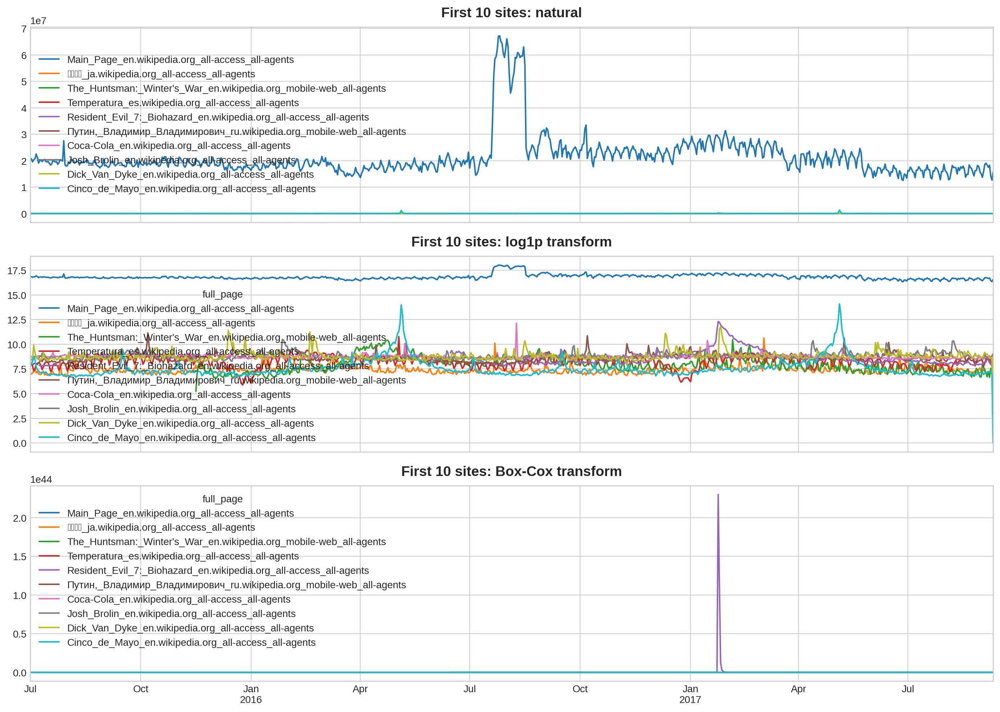

In [15]:
eps = 1e-5 # Small epsilon for Box-Cox transform

fig, axs = plt.subplots(3,1, sharex=True, figsize=(14,10))

df_train[indx_10_pages].plot(ax = axs[0], title = f'First {len(indx_10_pages)} sites: natural', grid=True)
axs[0].legend(loc=6)
df_train[indx_10_pages].apply(np.log1p).plot(ax = axs[1],title=f'First {len(indx_10_pages)} sites: log1p transform', grid=True)
df_train[indx_10_pages].apply(lambda x: stats.boxcox(x + eps)[0]).plot(ax=axs[2],title=f'First {len(indx_10_pages)} sites: Box-Cox transform', grid=True)
plt.show()

# Statistical testing

## Jarque-Bera test of normality of the distribution

In [16]:
for col in indx_10_pages:
    #row =  [u'JB', u'p-value', u'skew', u'kurtosis']
    jb_test = sm.stats.stattools.jarque_bera(df_train[col].fillna(0))
    #a = np.vstack([jb_test])
    #itog = SimpleTable(a, row)
    print(f'{col} \t p-value = {jb_test[1]}')

Main_Page_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
大塚芳忠_ja.wikipedia.org_all-access_all-agents 	 p-value = 0.0
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents 	 p-value = 0.0
Temperatura_es.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents 	 p-value = 0.0
Coca-Cola_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Josh_Brolin_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0


In [17]:
for col in indx_10_pages:
    #row =  [u'JB', u'p-value', u'skew', u'kurtosis']
    jb_test = sm.stats.stattools.jarque_bera(np.log1p(df_train[col].fillna(0)))
    #a = np.vstack([jb_test])
    #itog = SimpleTable(a, row)
    print(f'{col} \t p-value = {jb_test[1]}')

Main_Page_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
大塚芳忠_ja.wikipedia.org_all-access_all-agents 	 p-value = 0.0
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents 	 p-value = 4.74551804267916e-72
Temperatura_es.wikipedia.org_all-access_all-agents 	 p-value = 7.337745094128567e-45
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents 	 p-value = 3.6705245330966095e-27
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents 	 p-value = 0.0
Coca-Cola_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Josh_Brolin_en.wikipedia.org_all-access_all-agents 	 p-value = 1.5269006032101884e-166
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0


In [18]:
for col in indx_10_pages:
    #row =  [u'JB', u'p-value', u'skew', u'kurtosis']
    jb_test = sm.stats.stattools.jarque_bera(stats.boxcox(df_train[col].fillna(0) + 1e-5)[0])
    #a = np.vstack([jb_test])
    #itog = SimpleTable(a, row)
    print(f'{col} \t p-value = {jb_test[1]}')

Main_Page_en.wikipedia.org_all-access_all-agents 	 p-value = 4.731792343109069e-05
大塚芳忠_ja.wikipedia.org_all-access_all-agents 	 p-value = 0.5342318641724582
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents 	 p-value = 4.979456449001095e-32
Temperatura_es.wikipedia.org_all-access_all-agents 	 p-value = 7.3539427593923676e-68
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents 	 p-value = 7.171531272846392e-29
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents 	 p-value = 0.4107411815878532
Coca-Cola_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Josh_Brolin_en.wikipedia.org_all-access_all-agents 	 p-value = 0.7824257511079167
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents 	 p-value = 0.0


## Augmented Dickey–Fuller Test

The Augmented Dickey-Fuller Test is used to determine if time-series data is stationary or not. Similar to a t-test, we set a significance level before the test and make conclusions on the hypothesis based on the resulting p-value.

* Null Hypothesis: The data is not stationary (time series has a unit root).

* Alternative Hypothesis: The data is stationary (time series doesn't have a unit root).

For the data to be stationary (ie. reject the null hypothesis), the ADF test should have: p-value <= significance level (0.01, 0.05, 0.10, etc.).

If the p-value is greater than the significance level then we can say that it is likely that the data is not stationary, i.e. we cannot reject the null-hypothesis.

The ADF test results below indicate that the data is highly likely to be stationary. That is, the data does not have a trend line and there is no need to fit it further.

In [19]:
df_adftest = pd.DataFrame(index=indx_10_pages, columns=['autolag', 'lag_7', 'lag_30', 'lag_91', 'lag_182'])

for col in indx_10_pages: 
    #print(f'ADF test result; page {col}:')
    ts = np.log1p(df_train.loc[df_firstDay[col]:,col].fillna(0))
    
    df_adftest.loc[col,'autolag'] = adfuller(ts, autolag='AIC')[1]
    df_adftest.loc[col,'lag_7'] = adfuller(ts, maxlag=7, autolag='AIC')[1] # Weekly data seasonality
    df_adftest.loc[col,'lag_30'] = adfuller(ts, maxlag=30, autolag='AIC')[1] # Monthly data seasonality
    df_adftest.loc[col,'lag_91'] = adfuller(ts, maxlag=91, autolag='AIC')[1] # Quarterly data seasonality
    df_adftest.loc[col,'lag_182'] = adfuller(ts, maxlag=182, autolag='AIC')[1] # Semiannual data seasonality


In [20]:
df_adftest > 0.05

,autolag,lag_7,lag_30,lag_91,lag_182
Main_Page_en.wikipedia.org_all-access_all-agents,False,False,True,True,True
大塚芳忠_ja.wikipedia.org_all-access_all-agents,False,False,False,False,False
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,True,True,True,True,True
Temperatura_es.wikipedia.org_all-access_all-agents,False,False,False,False,False
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,True,True,True,True,True
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",False,False,False,False,False
Coca-Cola_en.wikipedia.org_all-access_all-agents,True,True,True,True,False
Josh_Brolin_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,True,True,True,True,True


### ADF test of the 1-st differences 

In [21]:
df_adftest_diff1 = pd.DataFrame(index=indx_10_pages, columns=['autolag', 'lag_7', 'lag_30', 'lag_91', 'lag_182'])

for col in indx_10_pages: 
    #print(f'ADF test result; page {col}:')
    ts = np.log1p(df_train.loc[df_firstDay[col]:,col].fillna(0))
    
    df_adftest_diff1.loc[col,'autolag'] = adfuller(ts.diff(1).dropna(), autolag='AIC')[1]
    df_adftest_diff1.loc[col,'lag_7'] = adfuller(ts.diff(1).dropna(), maxlag=7, autolag='AIC')[1] # Weekly data seasonality
    df_adftest_diff1.loc[col,'lag_30'] = adfuller(ts.diff(1).dropna(), maxlag=30, autolag='AIC')[1] # Monthly data seasonality
    df_adftest_diff1.loc[col,'lag_91'] = adfuller(ts.diff(1).dropna(), maxlag=91, autolag='AIC')[1] # Quarterly data seasonality
    df_adftest_diff1.loc[col,'lag_182'] = adfuller(ts.diff(1).dropna(), maxlag=182, autolag='AIC')[1] # Semiannual data seasonality


In [22]:
df_adftest_diff1 > 0.05

,autolag,lag_7,lag_30,lag_91,lag_182
Main_Page_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
大塚芳忠_ja.wikipedia.org_all-access_all-agents,False,False,False,False,False
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,False,False,False,False,False
Temperatura_es.wikipedia.org_all-access_all-agents,False,False,False,False,False
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",False,False,False,False,False
Coca-Cola_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Josh_Brolin_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,False,False,False,False,False


## KPSS Test

KPSS test has opposite to ADF Null-hypothesis:

* Null Hypothesis: The data is stationary (time series doesn't have a unit root).

* Alternative Hypothesis: The data is not stationary (time series has a unit root). 

Most of the series under study have p-value greater than 0.05, which confirms the null hypothesis and allow to consider the series as stationary.

In [23]:
df_kpss = pd.DataFrame(index=indx_10_pages, columns=['autolag', 'lag_7', 'lag_30', 'lag_91', 'lag_182'])

for col in indx_10_pages: 
    #print(f'ADF test result; page {col}:')
    ts = np.log1p(df_train.loc[df_firstDay[col]:,col].fillna(0))
    
    df_kpss.loc[col,'autolag'] = kpss(ts, regression="c")[1]
    df_kpss.loc[col,'lag_7'] = kpss(ts, nlags=7, regression="c")[1] # Weekly data seasonality
    df_kpss.loc[col,'lag_30'] = kpss(ts, nlags=30, regression="c")[1] # Monthly data seasonality
    df_kpss.loc[col,'lag_91'] = kpss(ts, nlags=91, regression="c")[1] # Quarterly data seasonality
    df_kpss.loc[col,'lag_182'] = kpss(ts, nlags=182, regression="c")[1] # Semiannual data seasonality

/home/jose/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning
/home/jose/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:2023: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warn_msg.format(direction="greater"), InterpolationWarning
/home/jose/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:2023: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warn_msg.format(direction="greater"), InterpolationWarning
/home/jose/anaconda3/lib/python3.7/site-packages/statsmodels/tsa

In [24]:
df_kpss > 0.05

,autolag,lag_7,lag_30,lag_91,lag_182
Main_Page_en.wikipedia.org_all-access_all-agents,False,False,True,True,True
大塚芳忠_ja.wikipedia.org_all-access_all-agents,True,False,True,True,True
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,False,False,True,True,True
Temperatura_es.wikipedia.org_all-access_all-agents,True,True,True,True,True
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,True,False,True,True,True
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",True,False,True,True,True
Coca-Cola_en.wikipedia.org_all-access_all-agents,False,False,False,True,True
Josh_Brolin_en.wikipedia.org_all-access_all-agents,False,False,False,True,True
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,True,True,True,True,True
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,True,True,True,True,True


-----------------------------

# Linear regressions

In [25]:
n_test_days = 61 # Number of days in test set
train_index, valid_index = train_test_split(df_train.index, test_size=n_test_days, shuffle=False)

In [26]:
def prediction_plot(series_true, series_fit, series_pred, ax=None, smape_val=None, text_kwargs = {}, **kwargs):   
   
    assert len(series_true) == len(series_fit) + len(series_pred), 'Inappropriate array sizes'
    
    if ax is None:
        fig, ax = plt.subplots()     
    
    ax = series_true.plot(ax = ax, color='0.25', alpha =0.4, style = '-',marker='.', **kwargs) #, title=f'{name}, n_fourier = {n_fourier}')
    ax = series_fit.plot(ax=ax, label = 'Fitted', color='C0')
    ax = series_pred.plot(ax=ax, label = 'Forecast', color='C3')
    ax.legend(loc = 'upper right')
    
    #text_kwargs.setdefault('smape', dict(size=14))
    text_kwargs.setdefault('prop', dict(size=14))
    text_kwargs.setdefault('frameon', True)    
    text_kwargs.setdefault('loc', 'lower center')
    
    if smape_val:
        at = AnchoredText(
            f"smape = {smape_val:.1f}",
            **text_kwargs
            #prop=dict(size=14),
            #frameon=True,
            #loc="upper left",
            #loc = kwargs['loc']
        )
        at.patch.set_boxstyle("square, pad=0.0")
        ax.add_artist(at)
        
    return ax      
    
def normalization(series): 
    return (series - np.mean(series))/np.std(series)

def norm_v2(series): 
    return series/sum(series)

def invboxcox(y,lmbda):
    if lmbda == 0:
        return(np.exp(y))
    else:
        return(np.exp(np.log(lmbda*y+1)/lmbda))

In [27]:
def deriv_filter(series, q):       
    
    y = series.copy()    
    y_median = y.rolling(90,min_periods=1,center=False).median()
    
    median = y.diff().median()
    mean = y.diff().mean()
    cut = y.diff().quantile(q)
    
    y_diff_ex = y.diff()[abs(y.diff()) > cut]    
    
    filtered_points = set()
    i = 0
    
    while y_diff_ex.any(): 
        
        i += y_diff_ex.shape[0]
        filtered_points = filtered_points | set(y_diff_ex.index) 
        
        #print(f'shape = {y_diff_ex.shape}, total = {i}')
        #y.loc[y_diff_ex.index] -= y_diff_ex - y_diff_ex.apply(lambda x: np.sign(x)*5*abs(median))        
        
        #y.drop(y_diff_ex.index,inplace=True)
        bad_index = set(y_diff_ex.index.append(y_diff_ex.index - pd.DateOffset(days=1)).sort_values()) & set(y.index)
        y[bad_index] = y_median[bad_index]
        
        #y[y_diff_ex.index] = y_median[y_diff_ex.index]
        y_diff_ex = y.diff() 
        y_diff_ex = y_diff_ex[abs(y_diff_ex) > cut]
        #print(f'y_diff_ex = {y_diff_ex}')
        
        if(i > y.size) or (len(filtered_points) > y.size/2) :
            break
              
        
    y_median[y.index] = y
        
    return y_median.fillna(series) 

In [28]:
def quantile_filter(series, q):
    
    y_filt = series.copy()
    y_filt_roll = y_filt.rolling(90, min_periods=1,center=True).median()
    y_filt[y_filt > y_filt.quantile(q)] = y_filt_roll[y_filt > y_filt.quantile(q)]
    return y_filt.fillna(y_filt_roll)
    

In [29]:
def add_period_stat(series, period, stat):
    return series.groupby(getattr(series.index,period)).agg(stat).apply(norm_v2)

def autocorr(series, lag):
    s1 = series[lag:]
    s2 = series[:-lag]
    ms1 = np.mean(s1)
    ms2 = np.mean(s2)
    ds1 = s1 - ms1
    ds2 = s2 - ms2
    divider = np.sqrt(np.sum(ds1 * ds1)) * np.sqrt(np.sum(ds2 * ds2))
    return np.sum(ds1 * ds2) / divider if divider != 0 else 0

In [30]:
class TrainSeriesWrapper:
    
    def __init__(self, series):
        self.first_day = series.notna().idxmax()
        self.series = series.loc[self.first_day:]
        self.log = None
        self.norm = None
        self.train_deriv_filt = None
        self.train_quantile_filt = None
        
        self.filt_func = None
        self.filt_train = None
        
    def normalize(self, ts):
        ts_mean = np.mean(ts)
        ts_std = np.std(ts)
        norm_ts = (ts - ts_mean)/ts_std
        
        return norm_ts, ts_mean, ts_std
        
    def get_train_split(self, n_test, log = True, norm=False):
        
        self.log = log
        self.norm = norm
        self.train_part = self.series.iloc[:-n_test]
        self.test_part = self.series.iloc[-n_test:]
        if self.log: 
            self.train_part = np.log1p(self.train_part)        
        if norm: 
            self.train_part, self.train_mean, self.train_std = self.normalize(self.train_part)
        else:
            self.train_mean = 0
            self.train_std = 1  
       
        return self
    
    def apply_deriv_filter(self, filt_func, **filt_kwargs):
        self.filt_func = filt_func
        self.train_filt = filt_func(self.train_part, **filt_kwargs)
        return self
    
   # def apply_quantile_filter(self, q):
   #     self.train_quantile_filt = quantile_filter(self.train_part, q)
        
        

In [31]:
class FitLinearModel:
    def __init__(self, model, ts_wrapper : TrainSeriesWrapper):
        self.model = model 
        self.best_smape = 2e4
        self.best_order = None
        self.best_fourier = None
        
        self.y_fit = None
        self.y_perd = None
        
        self.filt_func = None
        self.filt_q = None
        self.filt_list = None
        self.q_list = None
        
        self.best_filter = None
        self.best_filt_q = None
        self.best_train_filt = None
        
        try:
            self.ts_train = ts_wrapper.train_part
            self.ts_test = ts_wrapper.test_part
            self.train_mean = ts_wrapper.train_mean
            self.train_std = ts_wrapper.train_std
            self.train_log = ts_wrapper.log
            self.train_norm = ts_wrapper.norm
        
        except AttributeError:
            print(f'Objet {ts_wrapper} has no needed atributes: call get_train_split(n_test) function on class object. \n')   
            raise 
         
        
    def get_stat_feat(self): 
        
        ts_month_week_corr = normalization(self.ts_train.groupby([self.ts_train.index.year, self.ts_train.index.month]).apply(lambda x: x.corr(x.shift(7)))).groupby(level=1).mean()
        ts_week_2day_corr = normalization(self.ts_train.groupby(self.ts_train.index.isocalendar().week).apply(lambda x: x.corr(x.shift(2))))
        
        ts_month_week_corr.fillna(self.ts_train.corr(self.ts_train.shift(7)),inplace=True)
        ts_week_2day_corr.fillna(self.ts_train.corr(self.ts_train.shift(2)), inplace=True)
        
        return ts_month_week_corr, ts_week_2day_corr
    
      
    def get_period_stat(self, period, stat_list, norm_func=None):        
        if norm_func is None:
            return self.ts_train.groupby(getattr(self.ts_train.index,period)).agg(stat_list)
        else: 
            return self.ts_train.groupby(getattr(self.ts_train.index,period)).agg(stat_list).apply(norm_func)
        
    def add_stat_feat(self, X, period_list, stat_list):         
        
        for period in period_list:
            X = X.join(self.get_period_stat(period, stat_list, norm_func=norm_v2), on=getattr(X.index, period), rsuffix=f'_{period}')
        
        y_month_week_corr, y_week_2day_corr = self.get_stat_feat()
        
        X = X.join(y_month_week_corr, on=X.index.month,rsuffix='_monthweekcorr')     
        X = X.join(y_week_2day_corr, on=X.index.isocalendar().week,rsuffix='_2daycorr')  
            
        return X
        
    
    def get_X(self, nfour, trend_order, stat_list=['median'], period_list=['week','month','weekday']): 
        
        fourier = CalendarFourier('A',nfour)
        
        dp = DeterministicProcess(
            index = self.ts_train.index.append(self.ts_test.index),
            constant=True,
            order = trend_order, 
            seasonal=True,
            #drop=True,
            additional_terms=[fourier]
        )       
        
        X = dp.in_sample()
        
        X = self.add_stat_feat(X, period_list=period_list, stat_list=stat_list)
        
        self.X_train = X.loc[self.ts_train.index, :]
        self.X_test = X.loc[self.ts_test.index, :]
        
        return self        
  
   
    def fit_predict(self, X_train = None, y_train = None):
        
        if X_train is None:
            X_train = self.X_train
        if y_train is None: 
            y_train = self.ts_train
        
        self.model.fit(X_train, y_train)        
               
        ts_fit = pd.Series(self.model.predict(X_train), index=y_train.index) * self.train_std + self.train_mean
        ts_pred = pd.Series(self.model.predict(self.X_test), index=self.ts_test.index) * self.train_std + self.train_mean
        
        if self.train_log:
            ts_fit = np.expm1(ts_fit)
            ts_pred = np.expm1(ts_pred)
        
        return ts_fit, ts_pred
    
    
    def get_best_fit(self, max_fourier, max_order, y_train = None): 
        
        #if y_train is None: 
        #    y_train = self.ts_train  
        
        for four in range(1, max_fourier+1):            
            for trend_order in range(max_order + 1):
                
                try:
                    y_fit, y_pred = self.get_X(four, trend_order).fit_predict(y_train = y_train)
                    smape_val = func_smape(y_pred, self.ts_test)
                
                                
                    if smape_val < self.best_smape: 
                        self.best_smape = smape_val
                        self.best_order = trend_order
                        self.best_fourier = four
                        self.y_fit = y_fit
                        self.y_pred = y_pred
                    
                        if self.filt_func: 
                            self.best_filter = self.filt_func.__name__
                            self.best_filt_q = self.filt_q
                            self.best_train_filt = y_train
                
                except:
                    continue
        
        return self        
    
    
    def get_best_filt_fit(self, max_fourier, max_order, filt_list = None, q_list=[0.9]): 
        
        if filt_list is None:            
            self.get_best_fit(max_fourier, max_order)                       
        else:            
            self.filt_list = filt_list
            self.q_list = q_list            
            
            for func in filt_list:                
                self.filt_func = func
                
                for q in q_list:                     
                    self.filt_q = q
                    y_train = func(self.ts_train, q)
                    self.get_best_fit(max_fourier, max_order, y_train = y_train)                
        
        return self   
    

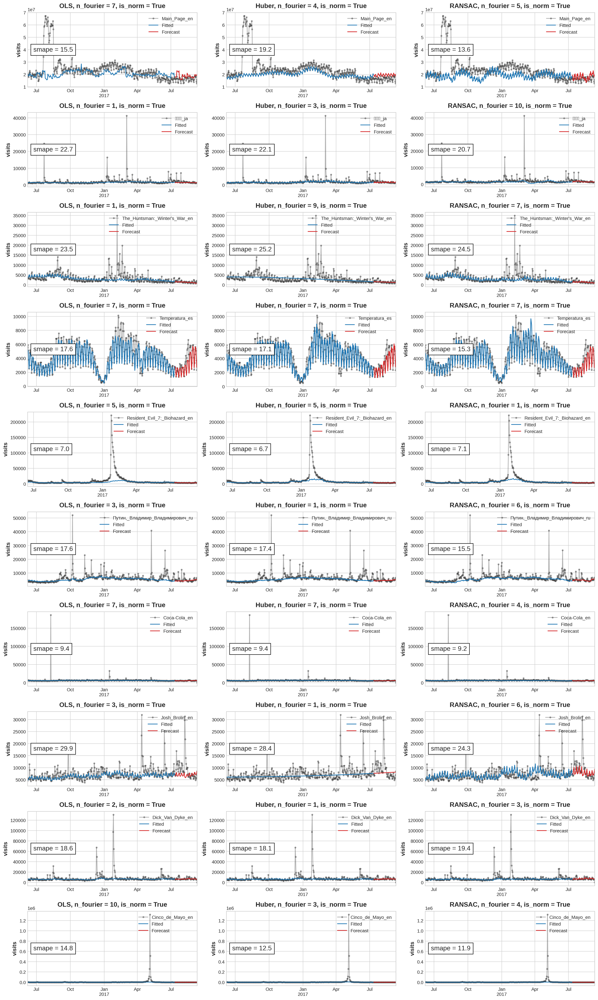

In [776]:
estimators = {'OLS': LinearRegression(), 'Huber': HuberRegressor(epsilon=1), 'RANSAC': RANSACRegressor(random_state=42)}
lin_results = {}

nfour = 4 
ncols = len(estimators)
nrows = len(indx_10_pages)

res_cols = ['trend_order', 'n_fourier', 'filter', 'q', 'smape', 'is_log', 'is_norm']
res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_resutls = pd.DataFrame(index = res_index, columns = res_cols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*6,nrows*3))

for i, col in enumerate(indx_10_pages):    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    #ts_wrap.get_train_split(n_test_days,norm=True)    
    
    for j, model_name in enumerate(estimators):
        
        lin_mod = FitLinearModel(estimators[model_name], ts_wrap)
        lin_results[model_name] = lin_mod.get_best_filt_fit(max_fourier=10, max_order=2, filt_list = [deriv_filter, quantile_filter], q_list=np.arange(0.9, 1, 0.01))
        df_best_resutls.loc[(col,model_name),res_cols] = [lin_mod.best_order, lin_mod.best_fourier, lin_mod.best_filter, lin_mod.best_filt_q.round(2),\
                                                          lin_mod.best_smape.round(1), ts_wrap.log, ts_wrap.norm]
        
        predplot_kwargs = {'label': col.split('.')[0], 'ylabel':'visits', 'title': f'{model_name}, n_fourier = {lin_mod.best_fourier}, is_norm = {ts_wrap.norm}'}
        text_sets = {'loc' : 'center left'}
        prediction_plot(ts_wrap.series[-(400+n_test_days):], lin_mod.y_fit[-400:], lin_mod.y_pred, ax=axs[i,j], smape_val= lin_mod.best_smape, text_kwargs=text_sets, **predplot_kwargs)

In [777]:
df_best_resutls.to_csv('fit_results/linear_model_results.csv')

In [788]:
df_best_resutls

trend_order  \
page                                                                estimator               
Main_Page_en.wikipedia.org_all-access_all-agents                    OLS                 0   
                                                                    Huber               0   
                                                                    RANSAC              0   
大塚芳忠_ja.wikipedia.org_all-access_all-agents                         OLS                 1   
                                                                    Huber               1   
                                                                    RANSAC              2   
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents   OLS                 2   
                                                                    Huber               2   
                                                                    RANSAC              2   
Temperatura_es.wikipedia.org_all-access_all-agents                  OLS                 2   
                                                                    Huber               1   
                                                                    RANSAC              2   
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents   OLS                 0   
                                                                    Huber               0   
                                                                    RANSAC              0   
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents OLS                 1   
                                                                    Huber               1   
                                                                    RANSAC              2   
Coca-Cola_en.wikipedia.org_all-access_all-agents                    OLS                 1   
                                                                    Huber               1   
                                                                    RANSAC              1   
Josh_Brolin_en.wikipedia.org_all-access_all-agents                  OLS                 2   
                                                                    Huber               2   
                                                                    RANSAC              1   
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents                OLS                 1   
                                                                    Huber               1   
                                                                    RANSAC              1   
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents                OLS                 0   
                                                                    Huber               1   
                                                                    RANSAC              0   

                                                                              n_fourier  \
page                                                                estimator             
Main_Page_en.wikipedia.org_all-access_all-agents                    OLS               7   
                                                                    Huber             4   
                                                                    RANSAC            5   
大塚芳忠_ja.wikipedia.org_all-access_all-agents                         OLS               1   
                                                                    Huber             3   
                                                                    RANSAC           10   
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents   OLS               1   
                                                                    Huber             9   
                                                                    RANSAC            7   
Temperatura_es.wikipedia.org_all-access_all-agents                  OLS               7   
         

<span style="color:darkblue"> 
<font size="4">
The best trend order does not revealed significant correlation with ADF test results
</font>
</span>

 
- <span style="color:darkred"> 
  <font size="4">
  Thus, all linear models have quite limited ability to predict these time series.
  </font>
  </span>

# ARIMA

In [32]:
df_adftest > 0.05

,autolag,lag_7,lag_30,lag_91,lag_182
Main_Page_en.wikipedia.org_all-access_all-agents,False,False,True,True,True
大塚芳忠_ja.wikipedia.org_all-access_all-agents,False,False,False,False,False
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,True,True,True,True,True
Temperatura_es.wikipedia.org_all-access_all-agents,False,False,False,False,False
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,True,True,True,True,True
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",False,False,False,False,False
Coca-Cola_en.wikipedia.org_all-access_all-agents,True,True,True,True,False
Josh_Brolin_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,True,True,True,True,True


## Autocorrelation and Partial autocorrelation plots of the initial series

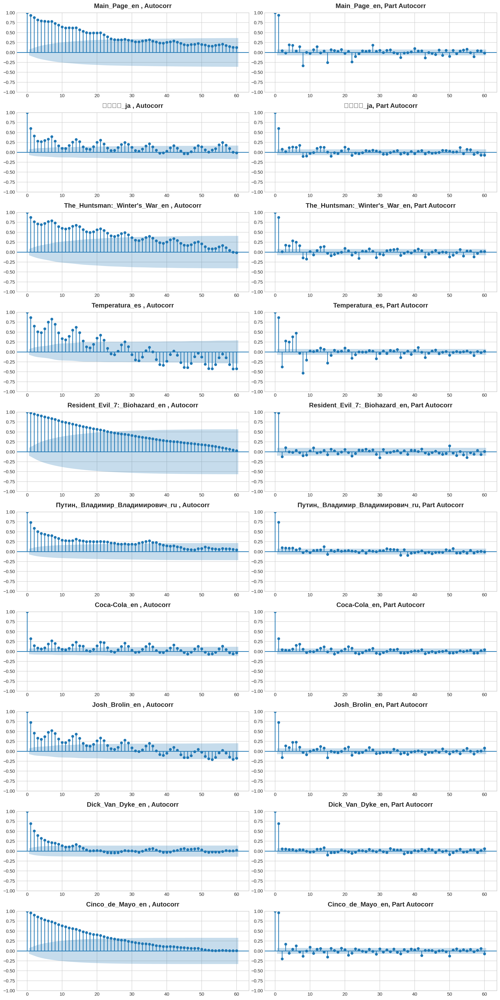

In [33]:
n_lags = 60
fig, axes = plt.subplots(len(indx_10_pages),2, figsize=(15,len(indx_10_pages)*3))

train_index, test_index = train_test_split(df_train.index, test_size=n_test_days, shuffle=False)

df_acf = pd.DataFrame(index=range(n_lags+1), columns=indx_10_pages)
df_pacf = pd.DataFrame(index=range(n_lags+1), columns=indx_10_pages)

for i, col in enumerate(indx_10_pages): 
    
    col_name = col.split('.')[0] 
    x = normalization(np.log1p(df_train.loc[df_firstDay[col]:train_index[-1],col].fillna(0)))
    
    plot_acf(x.fillna(0), ax = axes[i,0], lags = n_lags, title = f'{col_name} , Autocorr')
    df_acf.loc[:,col] = acf(x,nlags=n_lags)
    #axes[i,0].set_title(f'{col_name} , Autocorr')
    
    plot_pacf(x.fillna(0), ax=axes[i,1], lags = n_lags, title = f'{col_name}, Part Autocorr')
    df_pacf.loc[:,col] = pacf(x,nlags=n_lags)
    #axes[i,1].set_title(f'{col_name}, Part Autocorr')
    

## Autocorrelation and Partial autocorrelation plots of the series first differences

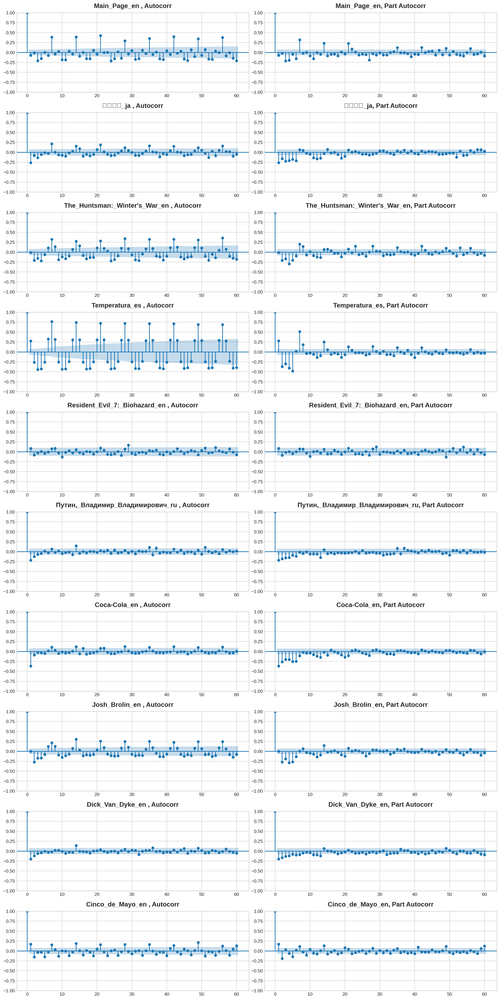

In [34]:
n_lags = 60
fig, axes = plt.subplots(len(indx_10_pages),2, figsize=(15,len(indx_10_pages)*3))

train_index, test_index = train_test_split(df_train.index, test_size=n_test_days, shuffle=False)

df_acf = pd.DataFrame(index=range(n_lags+1), columns=indx_10_pages)
df_pacf = pd.DataFrame(index=range(n_lags+1), columns=indx_10_pages)

for i, col in enumerate(indx_10_pages): 
    
    col_name = col.split('.')[0] 
    x = normalization(np.log1p(df_train.loc[df_firstDay[col]:train_index[-1],col].fillna(0)))
    
    plot_acf(x.diff(1).dropna(), ax = axes[i,0], lags = n_lags, title = f'{col_name} , Autocorr')
    #df_acf.loc[:,col] = acf(x,nlags=n_lags)
    #axes[i,0].set_title(f'{col_name} , Autocorr')
    
    plot_pacf(x.diff(1).dropna(), ax=axes[i,1], lags = n_lags, title = f'{col_name}, Part Autocorr')
    #df_pacf.loc[:,col] = pacf(x,nlags=n_lags)
    #axes[i,1].set_title(f'{col_name}, Part Autocorr')
    

<font color="darkred">
<font size="4"> 
Some series revealed strong weekly seasonality, but others didn't. The seasonality will be taken into account when building the SARIMA model further. Moreover, from these plots it is quite challenging to determine the best values of p and especially q for ARMA or ARIMA models. That's why, as in the previous case, when solving this problem I will rely mainly on the usual search.</font>
</font>


## Fit the model

In [33]:
class FitArimaModel:
    def __init__(self, ts_wrapper : TrainSeriesWrapper):
        
        self.best_smape = 2e4
        
        self.best_p = None
        self.best_d = None
        self.best_q = None
        
        self.best_ps = None
        self.best_ds = None
        self.best_qs = None
        
        self.y_fit = None
        self.y_perd = None
        
        self.filt_func = None
        self.filt_q = None
        self.filt_list = None
        self.q_list = None
        
        self.best_filter = None
        self.best_filt_q = None
        self.best_train_filt = None
        
        try:
            self.ts_train = ts_wrapper.train_part
            self.ts_test = ts_wrapper.test_part
            self.train_mean = ts_wrapper.train_mean
            self.train_std = ts_wrapper.train_std
            self.train_log = ts_wrapper.log
            self.train_norm = ts_wrapper.norm
        
        except AttributeError:
            print(f'Objet {ts_wrapper} has no needed atributes: call get_train_split(n_test) function on class object. \n')   
            raise      
        
  
   
    def fit_predict(self, p, d, q, ps = 0, ds = 0, qs = 0, s = 0, y_train = None):
        
        #print(f'p = {p}, d = {d}, q = {q}, ps = {ps}, ds = {ds}, qs = {qs}')
        
        if y_train is None: 
            y_train = self.ts_train   
            
        model = SARIMAX(y_train, order=(p,d,q), seasonal_order=(ps,ds,qs,s)) 
        result = model.fit(disp=False)    
    
        y_fit = result.get_prediction().predicted_mean
        y_fit = y_fit*self.train_std + self.train_mean
        
        n_test_days = self.ts_test.size
    
        y_predict = result.get_forecast(steps=n_test_days).predicted_mean
        y_predict = y_predict*self.train_std + self.train_mean
        
        if self.train_log:
            y_fit = np.expm1(y_fit)
            y_predict = np.expm1(y_predict)
        
        return y_fit, y_predict
    
    
    def get_best_arima_fit(self, p_max, d_max, q_max, ps = 0, ds = 0, qs = 0, s = 0, y_train = None): 
           
        if hasattr(p_max, '__iter__'):
            p_iter = p_max
        else:
            p_iter = range(1,p_max + 1)
        
        if hasattr(q_max, '__iter__'):
            q_iter = q_max
        else:
            q_iter = range(q_max + 1)
            
        if hasattr(d_max, '__iter__'):
            d_iter = d_max
        else:
            d_iter = range(d_max + 1)
        
        
        for d in d_iter:
            for p in p_iter:
                for q in q_iter:
                    
                    try:
                        y_fit, y_pred = self.fit_predict(p, d, q, ps, ds, qs, s, y_train = y_train)
                        smape_val = func_smape(y_pred, self.ts_test)                
                                
                        if smape_val < self.best_smape: 
                            
                            self.best_smape = smape_val
                            
                            self.best_p = p
                            self.best_d = d
                            self.best_q = q
                            
                            self.best_ps = ps
                            self.best_ds = ds
                            self.best_qs = qs
                                                        
                            self.y_fit = y_fit
                            self.y_pred = y_pred
                    
                            if self.filt_func: 
                                self.best_filter = self.filt_func.__name__
                                self.best_filt_q = self.filt_q
                                self.best_train_filt = y_train
                
                    except:
                        continue
        
        return self        
    
    
    def get_best_sarima_fit(self, p, d, q, ps_max, ds_max, qs_max, s, y_train = None, fit_arima=False): 
        
        if not fit_arima:
            self.best_p = p
            self.best_d = d
            self.best_q = q
        
        if hasattr(ps_max, '__iter__'):
            ps_iter = ps_max
        else:
            ps_iter = range(1,ps_max + 1)
        
        if hasattr(qs_max, '__iter__'):
            qs_iter = qs_max
        else:
            qs_iter = range(0,qs_max + 1)
            
        if hasattr(ds_max, '__iter__'):
            ds_iter = ds_max
        else:
            ds_iter = range(0,ds_max + 1)
           
        for ds in ds_iter:
            for ps in ps_iter:
                for qs in qs_iter:
                    
                    try:
                        if fit_arima: 
                            self.get_best_arima_fit(p_max=p, d_max=d, q_max=q, ps=ps, ds=ds, qs=qs, s=s, y_train=None)                            
                        else:
                            print(f'ps = {ps}, ds = {ds}, qs = {qs}, ')
                            y_fit, y_pred = self.fit_predict(p, d, q, ps, ds, qs, s, y_train = y_train)
                            smape_val = func_smape(y_pred, self.ts_test)
                            
                            print(f'smape_val = {smape_val}')
                                
                            if smape_val < self.best_smape: 
                                                               
                                self.best_smape = smape_val
                            
                                self.best_ps = ps
                                self.best_ds = ds
                                self.best_qs = qs
                                                        
                                self.y_fit = y_fit
                                self.y_pred = y_pred
                    
                                if self.filt_func: 
                                    self.best_filter = self.filt_func.__name__
                                    self.best_filt_q = self.filt_q
                                    self.best_train_filt = y_train
                
                    except:
                        continue                 
            
        
        return self        
    
    
    
    def get_best_filt_fit(self, filt_list, q_list=[0.9]): 
        
        def inner(get_best_func):
            
            def wrapper(*args, **kwargs): 
                self.filt_list = filt_list
                self.q_list = q_list            
            
                for func in filt_list:                
                    self.filt_func = func
                        
                    for q in q_list:  
                        q = np.float32(q).round(2)
                        self.filt_q = q
                        filt_train = func(self.ts_train, q)
                        get_best_func(*args, **kwargs, y_train = filt_train)
                
                return self
            return wrapper
        
        return inner   
    

### Original series (no filtering)

CPU times: user 14h 12min 30s, sys: 6min 7s, total: 14h 18min 38s
Wall time: 9h 19min 10s


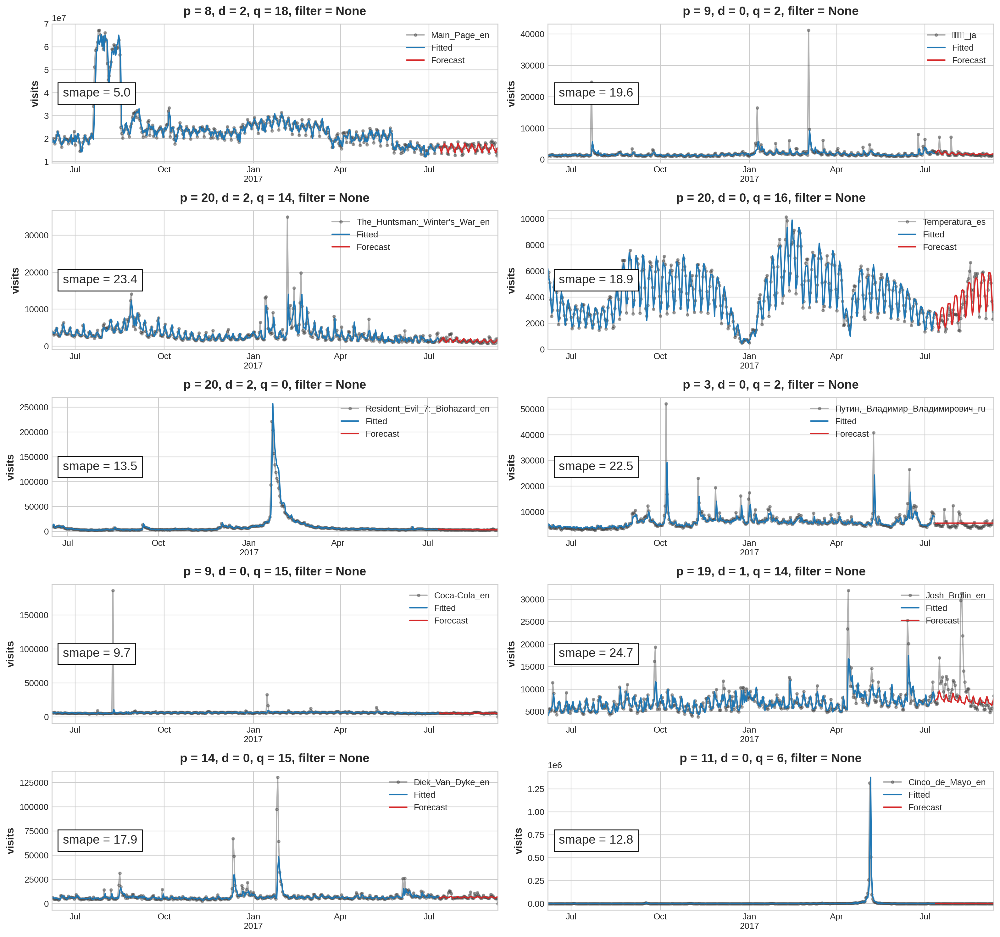

In [40]:
%%time

res_cols = ['p', 'd', 'q', 'filter', 'filt_q', 'smape', 'is_log', 'is_norm']
#res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_arima_resutls = pd.DataFrame(index = indx_10_pages, columns = res_cols)

arma_results = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    arma_mod = FitArimaModel(ts_wrap)
    #arma_results[col] = arma_mod.get_best_sarima_fit(p=2, d=0, q=2, ps_max=3, ds_max=0, qs_max=3, s=7, fit_arima=False)
    arma_results[col] = arma_mod.get_best_arima_fit(p_max=20, d_max=2, q_max=20)
    #arma_mod.get_best_filt_fit(filt_list=[quantile_filter, deriv_filter], q_list=[0.9,0.93,0.95,0.98, 0.99])(arma_mod.get_best_arima_fit)(p_max=20, d_max=1, q_max=20)
    
    df_best_arima_resutls.loc[col,res_cols] = [arma_mod.best_p, 
                                               arma_mod.best_d, 
                                               arma_mod.best_q, 
                                               arma_mod.best_filter, 
                                               arma_mod.best_filt_q,
                                               arma_mod.best_smape.round(1), 
                                               ts_wrap.log, 
                                               ts_wrap.norm]
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits', 
                       'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'center left'}
    prediction_plot(ts_wrap.series[-(400+n_test_days):], arma_mod.y_fit[-400:], arma_mod.y_pred, 
                    ax=ax, smape_val= arma_mod.best_smape, text_kwargs=text_sets, **predplot_kwargs)

In [41]:
df_best_arima_resutls.to_csv('fit_results/best_arima_results.csv')

### With filtering

CPU times: user 12h 24min 32s, sys: 9min 50s, total: 12h 34min 23s
Wall time: 4h 33min 17s


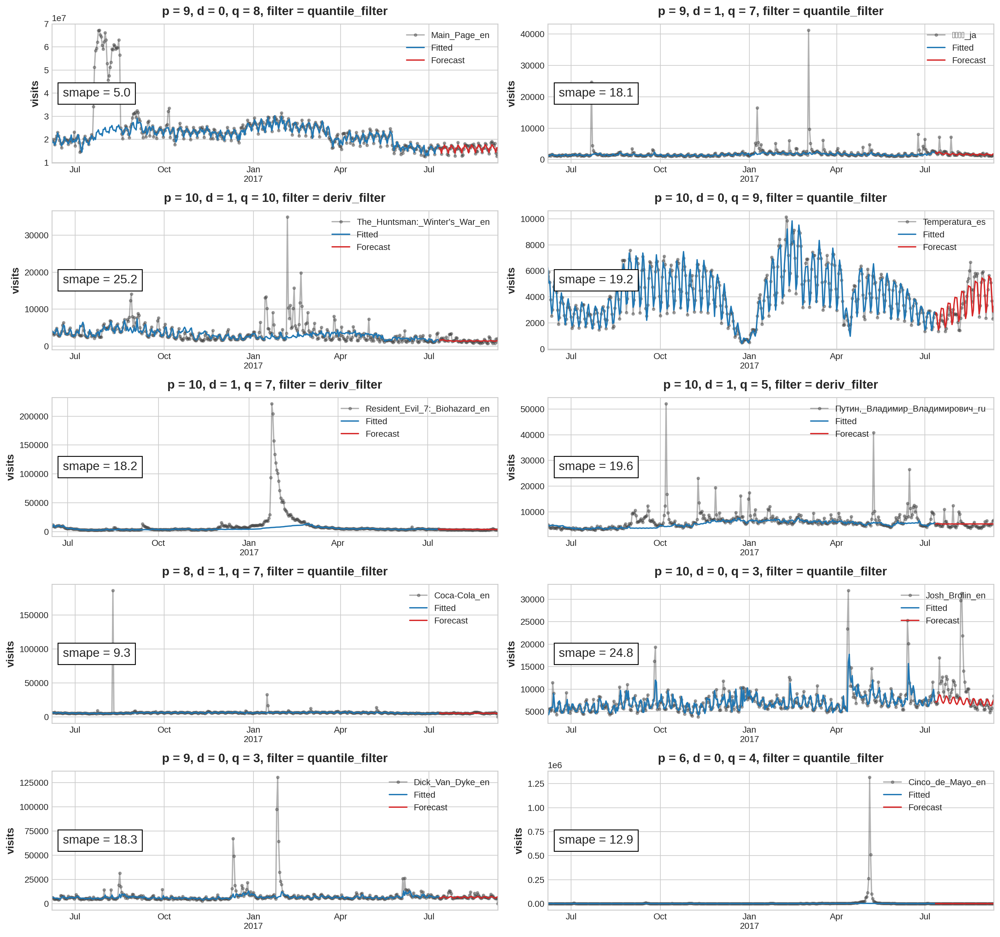

In [42]:
%%time

res_cols = ['p', 'd', 'q', 'filter', 'filt_q', 'smape', 'is_log', 'is_norm']
#res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_arima_filt_resutls = pd.DataFrame(index = indx_10_pages, columns = res_cols)

arma_filt_results = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    arma_mod = FitArimaModel(ts_wrap)
    #arma_results[col] = arma_mod.get_best_sarima_fit(p=2, d=0, q=2, ps_max=3, ds_max=0, qs_max=3, s=7, fit_arima=False)
    #arma_results[col] = arma_mod.get_best_arima_fit(p_max=20, d_max=2, q_max=20)
    arma_filt_results[col] = arma_mod.get_best_filt_fit(filt_list=[quantile_filter, deriv_filter], q_list=[0.9,0.93,0.95,0.98,1])(arma_mod.get_best_arima_fit)(p_max=10, d_max=1, q_max=10)
    
    df_best_arima_filt_resutls.loc[col,res_cols] = [arma_mod.best_p, 
                                                   arma_mod.best_d, 
                                                   arma_mod.best_q, 
                                                   arma_mod.best_filter, 
                                                   arma_mod.best_filt_q,
                                                   arma_mod.best_smape.round(1), 
                                                   ts_wrap.log, 
                                                   ts_wrap.norm]
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits', 
                       'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'center left'}
    prediction_plot(ts_wrap.series[-(400+n_test_days):], arma_mod.y_fit[-400:], arma_mod.y_pred, 
                    ax=ax, smape_val= arma_mod.best_smape, text_kwargs=text_sets, **predplot_kwargs)

In [45]:
df_best_arima_filt_resutls.to_csv('fit_results/best_arima_filt_results.csv')

In [61]:
df_adftest > 0.05

,autolag,lag_7,lag_30,lag_91,lag_182
Main_Page_en.wikipedia.org_all-access_all-agents,False,False,True,True,True
大塚芳忠_ja.wikipedia.org_all-access_all-agents,False,False,False,False,False
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,True,True,True,True,True
Temperatura_es.wikipedia.org_all-access_all-agents,False,False,False,False,False
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,True,True,True,True,True
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",False,False,False,False,False
Coca-Cola_en.wikipedia.org_all-access_all-agents,True,True,True,True,False
Josh_Brolin_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,False,False,False,False,False
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,True,True,True,True,True


In [51]:
df_best_arima_resutls.iloc[:,:-2].join(df_best_arima_filt_resutls.iloc[:,:-2], on=df_best_arima_resutls.index, rsuffix='_filt')

,p,d,q,filter,filt_q,smape,p_filt,d_filt,q_filt,filter_filt,filt_q_filt,smape_filt
Main_Page_en.wikipedia.org_all-access_all-agents,8,2,18,None,None,5.0,9,0,8,quantile_filter,0.95,5.0
大塚芳忠_ja.wikipedia.org_all-access_all-agents,9,0,2,None,None,19.6,9,1,7,quantile_filter,0.93,18.1
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,20,2,14,None,None,23.4,10,1,10,deriv_filter,0.93,25.2
Temperatura_es.wikipedia.org_all-access_all-agents,20,0,16,None,None,18.9,10,0,9,quantile_filter,1.0,19.2
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,20,2,0,None,None,13.5,10,1,7,deriv_filter,0.98,18.2
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",3,0,2,None,None,22.5,10,1,5,deriv_filter,0.9,19.6
Coca-Cola_en.wikipedia.org_all-access_all-agents,9,0,15,None,None,9.7,8,1,7,quantile_filter,0.93,9.3
Josh_Brolin_en.wikipedia.org_all-access_all-agents,19,1,14,None,None,24.7,10,0,3,quantile_filter,1.0,24.8
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,14,0,15,None,None,17.9,9,0,3,quantile_filter,0.98,18.3
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,11,0,6,None,None,12.8,6,0,4,quantile_filter,0.9,12.9


The ARIMA results revealed some correleation with ADF test. As can be seen from the results, 
a significant increase in the model orders does not affect the accuracy. Moreover, after filtering, 
it can achieve the same or even better performance.

In next section, I try to account for seasonality that is clearly present in some series.

---------------

# SARIMA

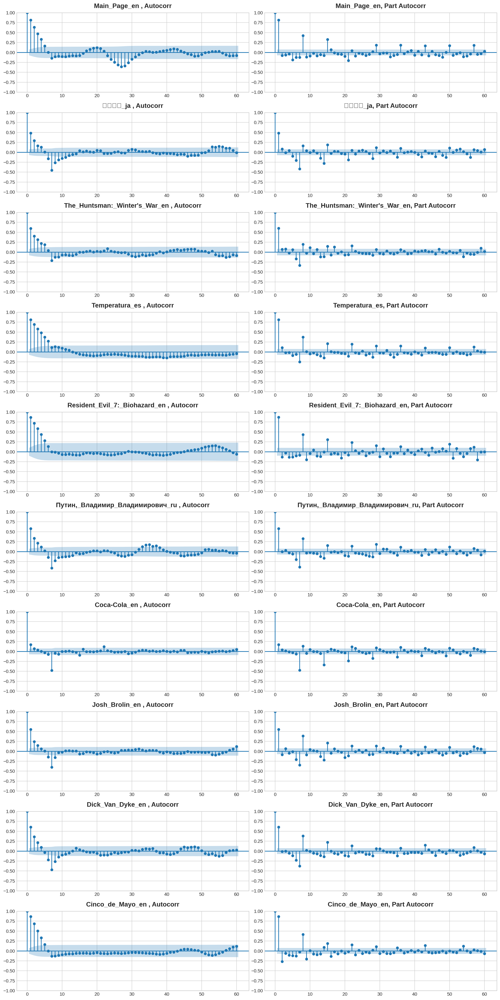

In [36]:
n_lags = 60
fig, axes = plt.subplots(len(indx_10_pages),2, figsize=(15,len(indx_10_pages)*3))

train_index, test_index = train_test_split(df_train.index, test_size=n_test_days, shuffle=False)

for i, col in enumerate(indx_10_pages): 
    
    col_name = col.split('.')[0] 
    x = normalization(np.log1p(df_train.loc[df_firstDay[col]:train_index[-1],col].fillna(0)))    
    x_diff_season7 = x.diff(7).dropna()
    
    plot_acf(x_diff_season7, ax = axes[i,0], lags = n_lags, title = f'{col_name} , Autocorr')
    #df_acf.loc[:,col] = acf(x,nlags=n_lags)
    #axes[i,0].set_title(f'{col_name} , Autocorr')
    
    plot_pacf(x_diff_season7, ax=axes[i,1], lags = n_lags, title = f'{col_name}, Part Autocorr')
    #df_pacf.loc[:,col] = pacf(x,nlags=n_lags)
    #axes[i,1].set_title(f'{col_name}, Part Autocorr')
    

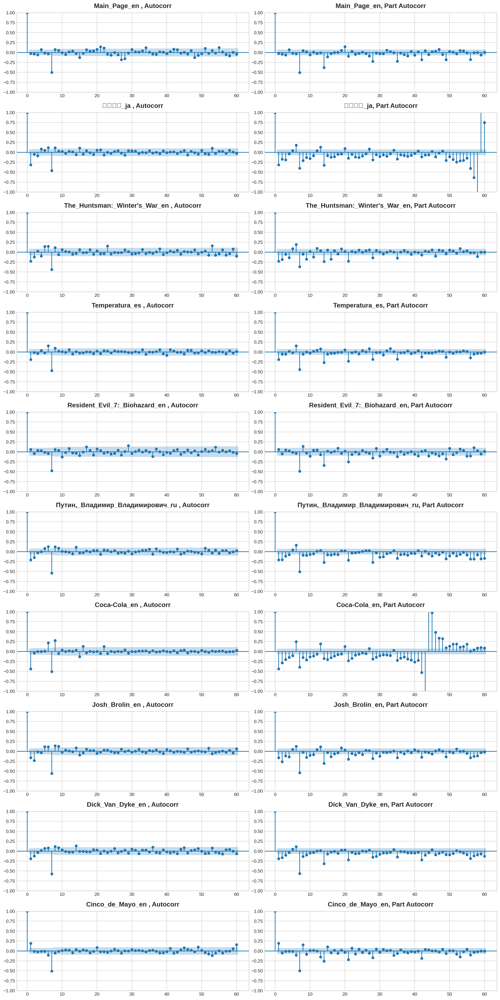

In [37]:
n_lags = 60
fig, axes = plt.subplots(len(indx_10_pages),2, figsize=(15,len(indx_10_pages)*3))

train_index, test_index = train_test_split(df_train.index, test_size=n_test_days, shuffle=False)

for i, col in enumerate(indx_10_pages): 
    
    col_name = col.split('.')[0] 
    x = normalization(np.log1p(df_train.loc[df_firstDay[col]:train_index[-1],col].fillna(0)))
    x_diff = x.diff(1).dropna()
    x_diff_season7 = x_diff.diff(7).dropna()
    
    plot_acf(x_diff_season7, ax = axes[i,0], lags = n_lags, title = f'{col_name} , Autocorr')
    #df_acf.loc[:,col] = acf(x,nlags=n_lags)
    #axes[i,0].set_title(f'{col_name} , Autocorr')
    
    plot_pacf(x_diff_season7, ax=axes[i,1], lags = n_lags, title = f'{col_name}, Part Autocorr')
    #df_pacf.loc[:,col] = pacf(x,nlags=n_lags)
    #axes[i,1].set_title(f'{col_name}, Part Autocorr')
    

In [38]:
df_best_arima_results = pd.read_csv('fit_results/best_arima_results.csv',index_col=0)
df_best_arima_filt_resutls = pd.read_csv('fit_results/best_arima_filt_results.csv', index_col=0)

In [87]:
''' Check the memory consumption'''

import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
mem = {
    key: value/1e6
    for key, value in sorted(
        [
            (x, sys.getsizeof(globals().get(x)))
            for x in dir()
            if not x.startswith("_") and x not in sys.modules and x not in ipython_vars
        ],
        key=lambda x: x[1],
        reverse=True,
    )
}

### Original series (no filtering)

Main_Page_en.wikipedia.org_all-access_all-agents
大塚芳忠_ja.wikipedia.org_all-access_all-agents
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents
Temperatura_es.wikipedia.org_all-access_all-agents
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents
Coca-Cola_en.wikipedia.org_all-access_all-agents
Josh_Brolin_en.wikipedia.org_all-access_all-agents
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents


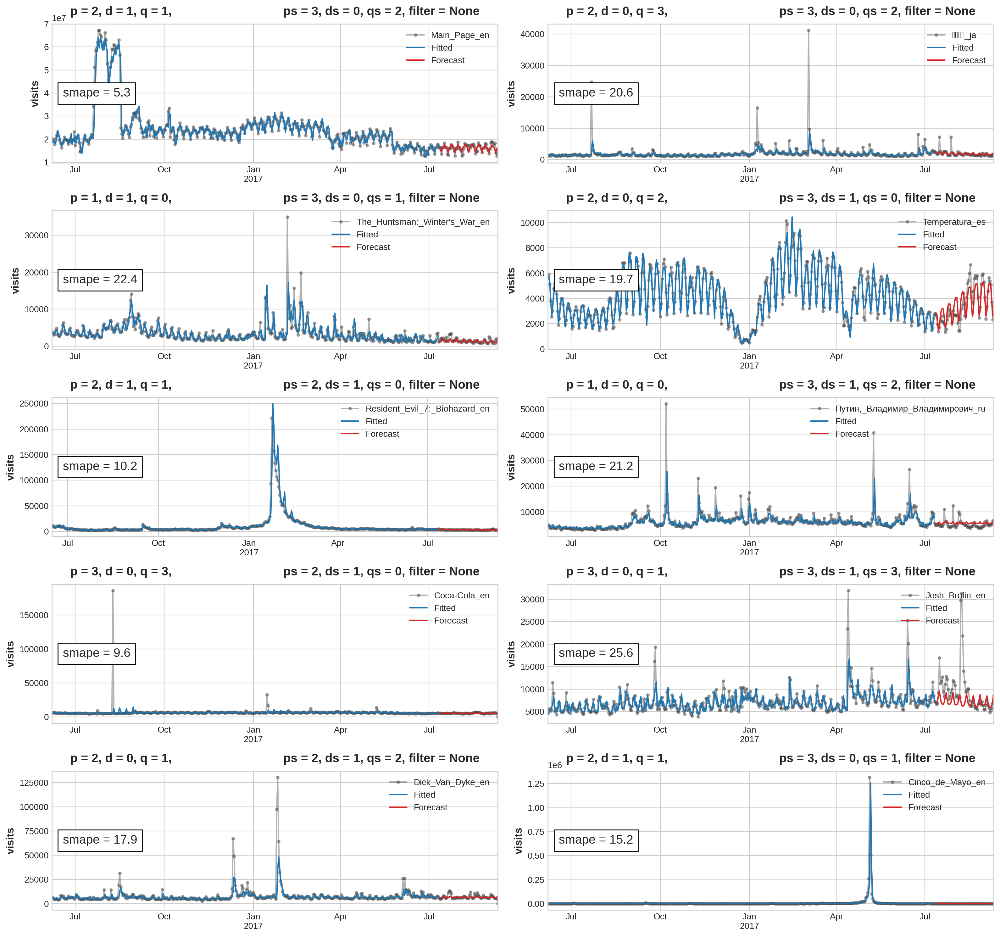

In [84]:
#%%time

res_cols = ['p', 'd', 'q', 'ps','ds','qs','s', 'filter', 'filt_q', 'smape', 'is_log', 'is_norm']
#res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_sarima_resutls = pd.DataFrame(index = indx_10_pages, columns = res_cols)

sarima_results = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    print(col)    
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    arma_mod = FitArimaModel(ts_wrap)
    
    sarima_results[col] = arma_mod.get_best_sarima_fit(p=3, d=1, q=3, ps_max=3, ds_max=1, qs_max=3, s=7, fit_arima=True)
    
    df_best_sarima_resutls.loc[col,res_cols] = [arma_mod.best_p, 
                                                    arma_mod.best_d, 
                                                    arma_mod.best_q,
                                                    arma_mod.best_ps,
                                                    arma_mod.best_ds,
                                                    arma_mod.best_qs,
                                                    7,
                                                    arma_mod.best_filter, 
                                                    arma_mod.best_filt_q,
                                                    round(arma_mod.best_smape,1), 
                                                    ts_wrap.log, 
                                                    ts_wrap.norm]
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits', 
                       'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, \
                                ps = {arma_mod.best_ps}, ds = {arma_mod.best_ds}, qs = {arma_mod.best_qs}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'center left'}
    prediction_plot(ts_wrap.series[-(400+n_test_days):], arma_mod.y_fit[-400:], arma_mod.y_pred, 
                    ax=ax, smape_val= arma_mod.best_smape, text_kwargs=text_sets, **predplot_kwargs)

In [85]:
df_best_sarima_resutls.to_csv('fit_results/best_sarima_resutls.csv')

### With filtering

CPU times: user 5h 3min 15s, sys: 2min 47s, total: 5h 6min 3s
Wall time: 2h 30min 43s


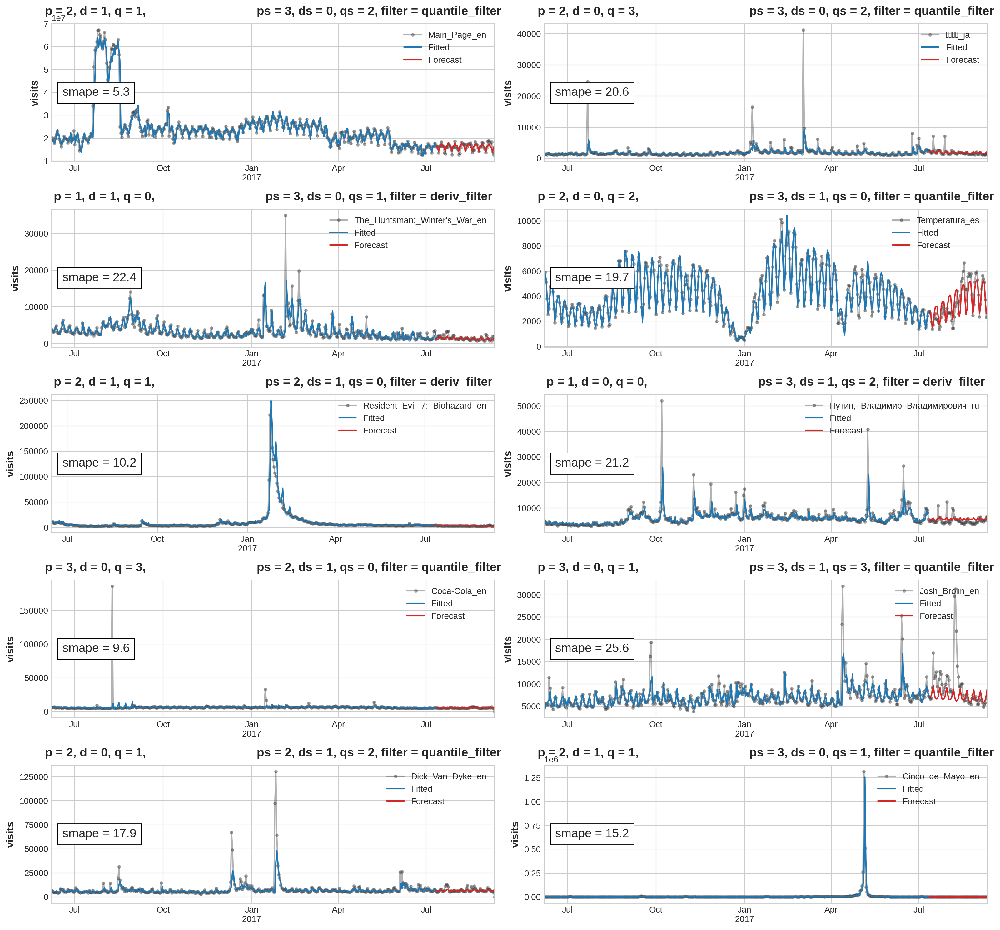

In [100]:
%%time

res_cols = ['p', 'd', 'q', 'ps','ds','qs','s', 'filter', 'filt_q', 'smape', 'is_log', 'is_norm']
#res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_sarima_filt_resutls = pd.DataFrame(index = indx_10_pages, columns = res_cols)

sarima_filt_results = {}

ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    arma_mod = FitArimaModel(ts_wrap)
    
    sarima_filt_results[col] = arma_mod.get_best_filt_fit(filt_list=[locals()[df_best_arima_filt_resutls.loc[col,'filter']]], q_list=[df_best_arima_filt_resutls.loc[col,'filt_q']])(arma_mod.get_best_sarima_fit)(p=3, d=1, q=3, ps_max=3, ds_max=1, qs_max=3, s=7, fit_arima=True)
    
    df_best_sarima_filt_resutls.loc[col,res_cols] = [arma_mod.best_p, 
                                                    arma_mod.best_d, 
                                                    arma_mod.best_q,
                                                    arma_mod.best_ps,
                                                    arma_mod.best_ds,
                                                    arma_mod.best_qs,
                                                    7,
                                                    arma_mod.best_filter, 
                                                    arma_mod.best_filt_q,
                                                    arma_mod.best_smape.round(1), 
                                                    ts_wrap.log, 
                                                    ts_wrap.norm]
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits', 
                       'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, \
                                ps = {arma_mod.best_ps}, ds = {arma_mod.best_ds}, qs = {arma_mod.best_qs}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'center left'}
    prediction_plot(ts_wrap.series[-(400+n_test_days):], arma_mod.y_fit[-400:], arma_mod.y_pred, 
                    ax=ax, smape_val= arma_mod.best_smape, text_kwargs=text_sets, **predplot_kwargs)

In [102]:
df_best_sarima_filt_resutls.to_csv('fit_results/best_sarima_filt_resutls.csv')

# Auto-ARIMA

<font color="darkred">
<font size="4"> 
The previous model selection is based on the SMAPE score on the test data set. 
But the performance of selected model is not evaluated on the validation data set, that is generally unfair. 
Further, I will try to fit ARIMA/SARIMA model using auto-arima library to compare the results. 
In this case, the model parameters are fully fitted on the training data set, and the test data is used only for the final assessment of the model performance.
</font>

## SARIMA

Main_Page_en.wikipedia.org_all-access_all-agents
大塚芳忠_ja.wikipedia.org_all-access_all-agents
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents
Temperatura_es.wikipedia.org_all-access_all-agents
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents
Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents
Coca-Cola_en.wikipedia.org_all-access_all-agents
Josh_Brolin_en.wikipedia.org_all-access_all-agents
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents
CPU times: user 1h 35min 40s, sys: 56.7 s, total: 1h 36min 37s
Wall time: 14min 34s


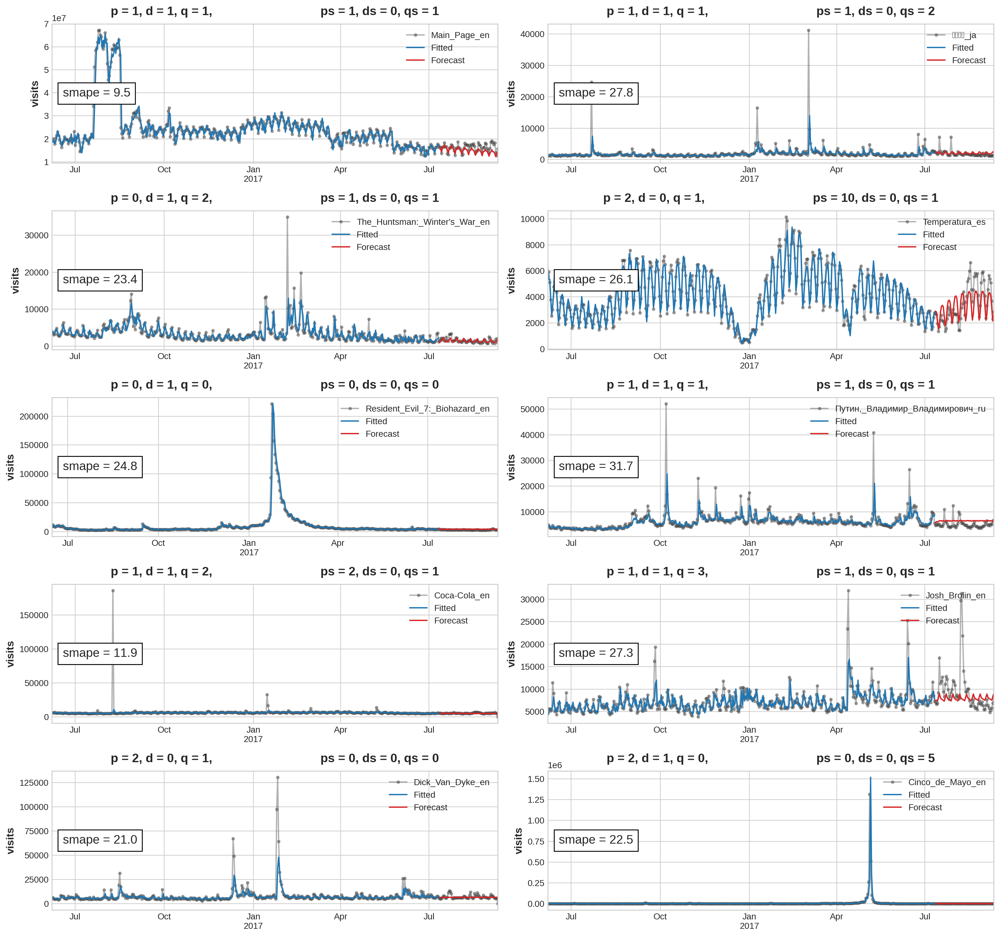

In [34]:
%%time
res_cols = ['p', 'd', 'q', 'ps','ds','qs','s', 'filter', 'filt_q', 'smape', 'is_log', 'is_norm']
#res_index = pd.MultiIndex.from_product([indx_10_pages, estimators.keys()], names=['page', 'estimator'])
df_best_auto_sarima_resutls = pd.DataFrame(index = indx_10_pages, columns = res_cols)

auto_sarima_models = {}


ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    print(col)
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True) 
    
    auto_sarima_model = pm.auto_arima(ts_wrap.train_part, 
                      start_p=1, 
                      start_q=1,
                      #test='adf', # use adftest to find optimal 'd'
                      max_p=10, 
                      max_d=1,
                      max_q=10, # maximum p and q
                      seasonal=True, # No Seasonality for standard ARIMA
                      max_P=10,
                      max_D=1,
                      max_Q=10,
                      m=7, # frequency of series (if m==1, seasonal is set to FALSE automatically)
                      max_order = None,
                      trace=False, #logs 
                      error_action='warn', #shows errors ('ignore' silences these)
                      suppress_warnings=True,
                      stepwise=True)
    
    auto_sarima_models[col] = auto_sarima_model
    
    y_fit = auto_sarima_model.predict_in_sample()*ts_wrap.train_std + ts_wrap.train_mean   
    y_predict = auto_sarima_model.predict(n_test_days)*ts_wrap.train_std + ts_wrap.train_mean   
  
    if ts_wrap.log:
        y_fit = np.expm1(y_fit)
        y_predict = np.expm1(y_predict)
        
    smape_valid = func_smape(y_predict,ts_wrap.test_part) 
    
    df_best_auto_sarima_resutls.loc[col,res_cols] = [auto_sarima_model.order[0], 
                                                     auto_sarima_model.order[1],
                                                     auto_sarima_model.order[2], 
                                                     auto_sarima_model.seasonal_order[0],
                                                     auto_sarima_model.seasonal_order[1],
                                                     auto_sarima_model.seasonal_order[2],
                                                     auto_sarima_model.seasonal_order[3],
                                                     None,
                                                     None,
                                                     round(smape_valid,1),
                                                     ts_wrap.log, 
                                                     ts_wrap.norm]
    
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits',
                       'title': f'p = {auto_sarima_model.order[0]}, d = {auto_sarima_model.order[1]}, q = {auto_sarima_model.order[2]},\
                                ps = {auto_sarima_model.seasonal_order[0]}, ds = {auto_sarima_model.seasonal_order[1]}, qs = {auto_sarima_model.seasonal_order[2]}'}
    text_sets = {'loc' : 'center left'}
    prediction_plot(ts_wrap.series[-(400+n_test_days):], y_fit[-400:], y_predict, 
                    ax=ax, smape_val= smape_valid, text_kwargs=text_sets, **predplot_kwargs)       
    
    

In [36]:
df_best_auto_sarima_resutls.to_csv('fit_results/best_auto_sarima_resutls.csv')

------------------------------

# Prophet

In [43]:
from prophet import Prophet

## Original series (no filtering)

17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1]

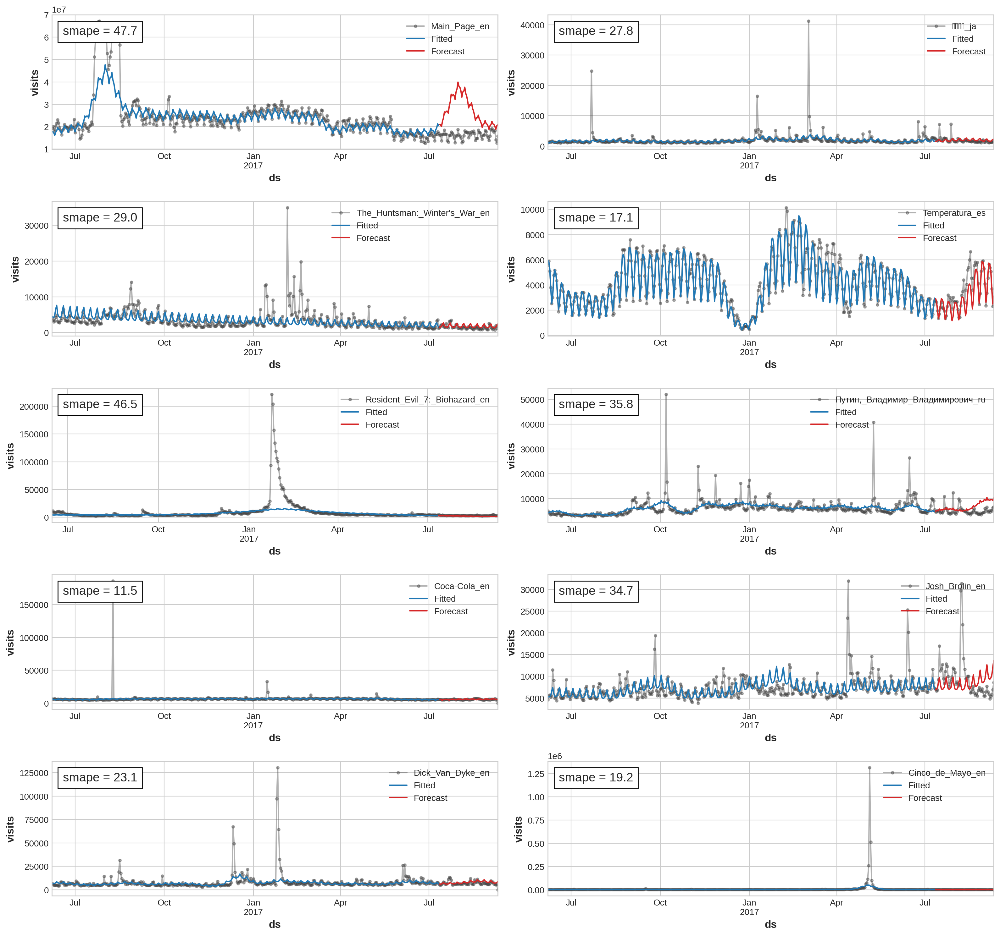

In [180]:
ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

models = {}

smape_results = pd.DataFrame(index=indx_10_pages)

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    df_pr = ts_wrap.train_part.to_frame().reset_index()
    df_pr.columns = ['ds', 'y']    
    
    models[col] = Prophet()    
    models[col].fit(df_pr)
    
    future = models[col].make_future_dataframe(n_test_days)
    forecast = models[col].predict(future)
    
    y_fore = forecast.set_index('ds').yhat
    y_fore = np.expm1(y_fore * ts_wrap.train_std + ts_wrap.train_mean)
    
    smape_results.loc[col,'no_filter'] = func_smape(y_fore[ts_wrap.test_part.index], ts_wrap.test_part)
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits',}
                       #'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'upper left'}
    
    prediction_plot(ts_wrap.series[-(400+n_test_days):], y_fore[ts_wrap.train_part[-400:].index], y_fore[ts_wrap.test_part.index], 
                    ax=ax, smape_val= smape_results.loc[col,'no_filter'], text_kwargs=text_sets, **predplot_kwargs)   

# With filtering

The same filters that were selected for each time series when fitting the ARIMA model and stored in the file “best_arima_filt_results.csv” are used here.

In [156]:
df_best_arima_filt = pd.read_csv('best_arima_filt_results.csv',index_col=0)
df_best_arima_filt

,p,d,q,filter,filt_q,smape,is_log,is_norm
Main_Page_en.wikipedia.org_all-access_all-agents,9,0,8,quantile_filter,0.95,5.0,True,True
大塚芳忠_ja.wikipedia.org_all-access_all-agents,9,1,7,quantile_filter,0.93,18.1,True,True
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,10,1,10,deriv_filter,0.93,25.2,True,True
Temperatura_es.wikipedia.org_all-access_all-agents,10,0,9,quantile_filter,1.00,19.2,True,True
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,10,1,7,deriv_filter,0.98,18.2,True,True
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",10,1,5,deriv_filter,0.90,19.6,True,True
Coca-Cola_en.wikipedia.org_all-access_all-agents,8,1,7,quantile_filter,0.93,9.3,True,True
Josh_Brolin_en.wikipedia.org_all-access_all-agents,10,0,3,quantile_filter,1.00,24.8,True,True
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,9,0,3,quantile_filter,0.98,18.3,True,True
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,6,0,4,quantile_filter,0.90,12.9,True,True


17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1]

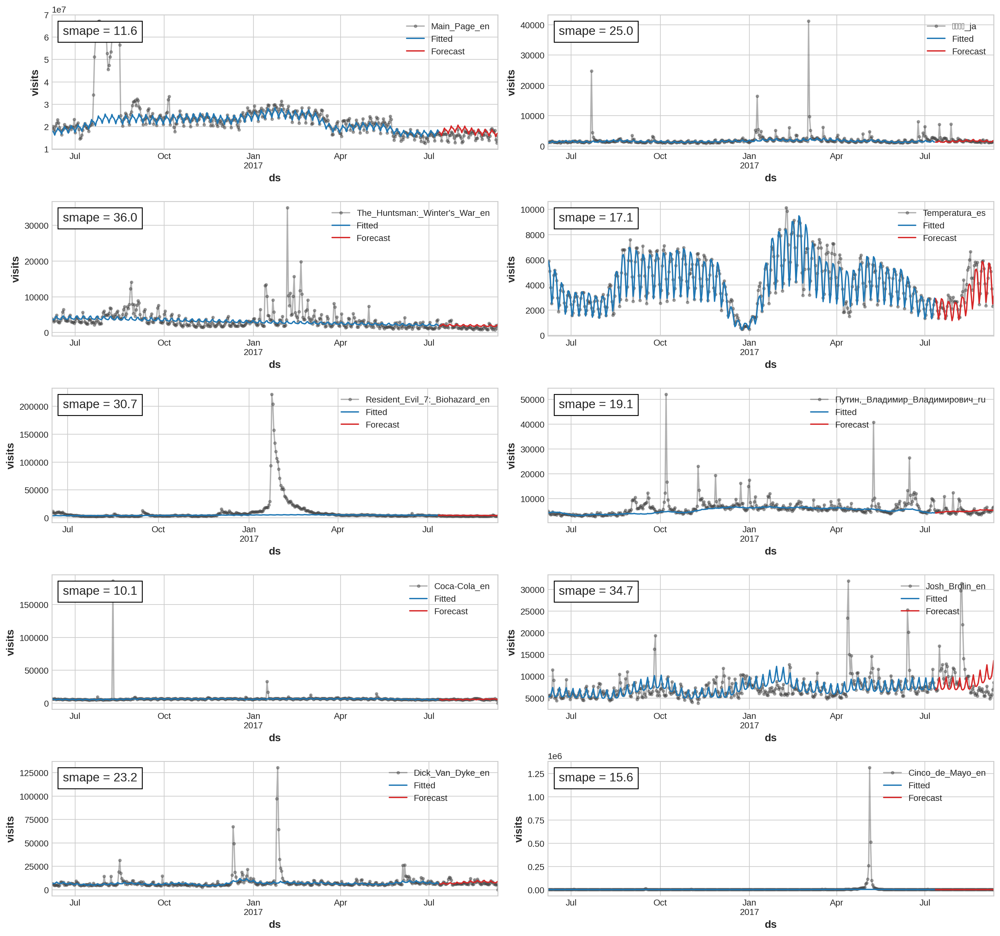

In [181]:
ncols = 2
nrows = math.ceil(len(indx_10_pages)/ncols)

fig, axs = plt.subplots(nrows=nrows, ncols = ncols, sharex=False, sharey=False, figsize=(ncols*8,nrows*3))

warnings.filterwarnings('ignore')

models = {}

for ax, col in zip(fig.get_axes(), indx_10_pages):
    
    ts_wrap = TrainSeriesWrapper(df_train[col]).get_train_split(n_test_days, norm=True)
    
    filter_type = locals()[df_best_arima_filt.loc[col,'filter']]
    q_filt = df_best_arima_filt.loc[col,'filt_q']
    
    ts_wrap = ts_wrap.apply_deriv_filter(filter_type, q = q_filt)
    
    df_pr = ts_wrap.train_filt.to_frame().reset_index()
    df_pr.columns = ['ds', 'y']    
    
    models[col] = Prophet()    
    models[col].fit(df_pr)
    
    future = models[col].make_future_dataframe(n_test_days)
    forecast = models[col].predict(future)
    
    y_fore = forecast.set_index('ds').yhat
    y_fore = np.expm1(y_fore * ts_wrap.train_std + ts_wrap.train_mean)
    
    smape_results.loc[col,'with_filter'] = func_smape(y_fore[ts_wrap.test_part.index], ts_wrap.test_part)
        
    predplot_kwargs = {'label': col.split('.')[0], 
                       'ylabel':'visits',}
                       #'title': f'p = {arma_mod.best_p}, d = {arma_mod.best_d}, q = {arma_mod.best_q}, filter = {arma_mod.best_filter}'}
    text_sets = {'loc' : 'upper left'}
    
    prediction_plot(ts_wrap.series[-(400+n_test_days):], y_fore[ts_wrap.train_part[-400:].index], y_fore[ts_wrap.test_part.index], 
                    ax=ax, smape_val= smape_results.loc[col,'with_filter'], text_kwargs=text_sets, **predplot_kwargs)   

In [182]:
smape_results = smape_results.join(df_best_arima_filt[['filter','filt_q']])
smape_results

,no_filter,with_filter,filter,filt_q
Main_Page_en.wikipedia.org_all-access_all-agents,47.744479,11.625616,quantile_filter,0.95
大塚芳忠_ja.wikipedia.org_all-access_all-agents,27.835912,25.033794,quantile_filter,0.93
The_Huntsman:_Winter's_War_en.wikipedia.org_mobile-web_all-agents,29.034072,35.951763,deriv_filter,0.93
Temperatura_es.wikipedia.org_all-access_all-agents,17.123775,17.123775,quantile_filter,1.00
Resident_Evil_7:_Biohazard_en.wikipedia.org_all-access_all-agents,46.453851,30.721318,deriv_filter,0.98
"Путин,_Владимир_Владимирович_ru.wikipedia.org_mobile-web_all-agents",35.841444,19.140290,deriv_filter,0.90
Coca-Cola_en.wikipedia.org_all-access_all-agents,11.456038,10.139559,quantile_filter,0.93
Josh_Brolin_en.wikipedia.org_all-access_all-agents,34.690941,34.690941,quantile_filter,1.00
Dick_Van_Dyke_en.wikipedia.org_all-access_all-agents,23.112807,23.207538,quantile_filter,0.98
Cinco_de_Mayo_en.wikipedia.org_all-access_all-agents,19.170153,15.593503,quantile_filter,0.90
